# Extracting Sequences of Spectra with IRISreader

It might be interesting to extract time series of spectra from IRIS observations. For example, one could observe the evolution of a single pixel in a sit-and-stare observation over time. This is however more involved for n-step rasters that sweep periodically over a series of positions. There it will make more sense to extract the spectra at the individual raster positions, resulting e.g. in 8 sequences for a single pixel for e.g. 8 different raster positions. This will make sure that the change of position is accounted for. The time intervals between the steps of the sequence will then of course be longer.

In the following, we explain sequence extraction for both sit-and-stare and n-step raster observations.

**Important note:**<br>
We extract only camera pixels and assume that the y-position of the camera is more or less fixed. This is of course not entirely true, as the camera has a slight jitter and the correct way would be to access pixels by coordinates. We suspect however that nearby pixels are strongly correlated and the effect of neglecting camera jitter will not be too big. This has however to be verified.

## 1. Sit-and-stare Observations

In [1]:
from irisreader import observation

# set your path accordingly
obs = observation("/home/chuwyler/Desktop/FITS/20140910_112825_3860259453/", keep_null=True )
obs

Large sit-and-stare 0.3x120 1s  Si IV   Mg II h/k Deep x 8  FUV spec
2014-09-10 11:28:25 - 2014-09-10 17:58:08

SJI lines:
  field  wavelength     description
0  FUV2      1400.0      Si IV 1400
1   NUV      2796.0  Mg II h/k 2796

raster lines:
  field  wavelength   description
0  FUV1      1335.7     C II 1336
1  FUV1      1343.3          1343
2  FUV1      1349.4   Fe XII 1349
3  FUV1      1355.6      O I 1356
4  FUV2      1402.8    Si IV 1403
5   NUV      2832.8          2832
6   NUV      2826.7          2826
7   NUV      2814.5          2814
8   NUV      2796.2  Mg II k 2796

### 1.1 Extracting Spectral Sequences

### 1.1.1 Extracting Single Pixels

First we crop the raster (this is not straightforward for all lines!):

In [2]:
raster = obs.raster("Mg II k")
raster.crop( check_coverage=False, remove_bad=False )

100%|██████████| 2490/2490 [00:06<00:00, 357.80it/s]


Extract Mg II k raster pixel 400 as a time series of spectra and plot it:

In [3]:
pixel400_spectra = raster[:,400,:].clip(min=0)
pixel400_spectra.shape

(2490, 585)

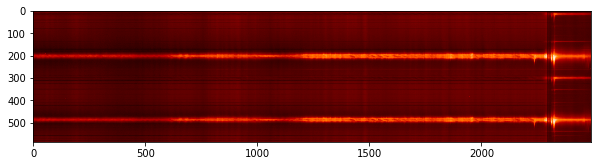

In [4]:
import matplotlib.pyplot as plt
import numpy as np
plt.figure( figsize=(10,5) )
plt.imshow( pixel400_spectra.T**0.4, cmap="gist_heat" )
plt.show()

Note that these are raw data counts. Because the exposure time of the camera can change throughout the observation, it makes sense to divide the data by the camera's exposure time:

In [5]:
raster.get_exptimes().shape

(2490,)

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


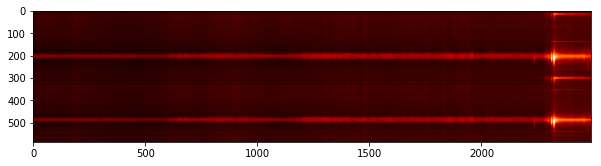

In [6]:
plt.figure( figsize=(10,5) )
plt.imshow( (pixel400_spectra.T / raster.get_exptimes())**0.4 , cmap="gist_heat" )
plt.show()

The following code visualizes all spectral windows for pixel 400 on the y-axis:

In [7]:
data = []
lines = []
pos = []
for i in range( len( obs.raster.get_lines() ) ):
    pixel400 = obs.raster[i][:,400,:].clip(min=0)
    pos.append( pixel400.shape[1] )
    lines.append( obs.raster[i].line_info )
    data.append( pixel400 )
data = np.hstack( data )
pos = np.cumsum( pos ) - np.array(pos)/2

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


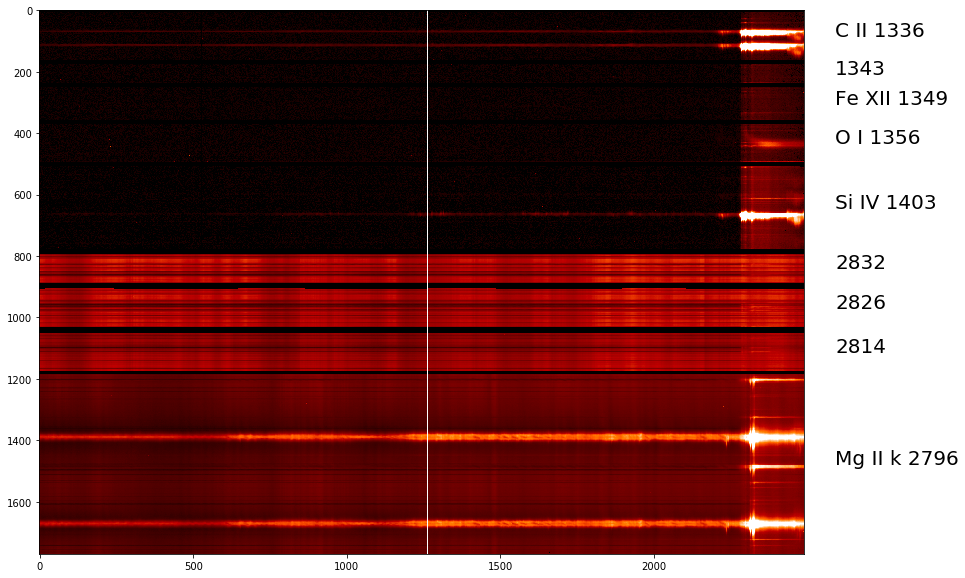

In [8]:
plt.figure( figsize=(15,10) )
plt.imshow( (data.T / raster.get_exptimes())**0.4 , cmap="gist_heat", vmax=10 )

for i in range( len( pos ) ):
    plt.text( data.shape[0]+100, pos[i], lines[i], fontsize=20 )

plt.show()

The white line is a pixel with zero exposure time and probably comes from an instrument artifact.

We need to cleanup a little, to have space in memory for what comes next:

In [9]:
del data

In [10]:
for raster in obs.raster:
    raster.close()

All the different raster lines were loaded into RAM - we need to close them to free the memory again. They will be reopened automatically.

### 1.1.2 Creating an Array with All Pixel Sequences

This is easy for one observation:

In [11]:
raster = obs.raster("Mg II k")
raster_data = raster[:,:,:]
raster_data.shape

(2490, 709, 585)

(709 sequences with 2487 spectra with 585 frequency bins each)

Because we will not use it anymore, let us delete `raster_data` again, since it consumes a lot of RAM:

In [12]:
del raster_data

If another spectral resolution is desired, e.g. to harmonized between multiple observations, the data has to be interpolated. This can be a delicate task, since RAM might already be almost full from the opened file. If RAM is an issue, it makes sense to store the results in a memory-mapped numpy array:

**Important Note**: `np.memmap`'s default array type is `uint`, this will cause problems if not changed to float!

In [13]:
import numpy as np

n_bins = 100
spectral_seq = np.memmap( 
    "spectra_memmap.dat", shape=( raster.shape[0], raster.shape[1], n_bins ), mode="w+", dtype=np.float16 
)

In [14]:
raster.shape

(2490, 709, 585)

In [15]:
from irisreader.data.mg2k_centroids import LAMBDA_MIN, LAMBDA_MAX
from tqdm import tqdm

for i in tqdm( range( raster.shape[0] ) ):
    spectral_seq[i,:,:] = raster.get_interpolated_image_step( i, LAMBDA_MIN, LAMBDA_MAX, n_bins, divide_by_exptime=True )

100%|██████████| 2490/2490 [00:35<00:00, 70.03it/s]


In [16]:
spectral_seq.shape

(2490, 709, 100)

The following animation function shows an animated series of spectra (normalized to maximum value of 1 to see differences in shapes, not intensity):

In [17]:
from matplotlib import animation
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML

def animate_spectrum( spectral_seq, y_pixel, figsize=(12,7), interval_ms=100 ):
    
    # create pixel window with normalized spectra
    spectral_window = spectral_seq[:,y_pixel,:] / np.max( spectral_seq[:,y_pixel,:], axis=1 ).reshape(-1,1)

    # initialize plot
    fig = plt.figure( figsize=figsize )

    line, = plt.plot( spectral_window[0,:] )
    plt.ylim( [0, 1.2] )
            
    # do nothing in the initialization function
    def init():
        return line,

    # animation function
    def animate(i):
        line.set_ydata( spectral_window[i,:] )
        return line,

    # call the animator
    anim = animation.FuncAnimation(
        fig, animate, init_func=init, frames=spectral_window.shape[0], interval=interval_ms, blit=True
    )
    
    # close the plot
    plt.close(anim._fig)
    
    return HTML(anim.to_html5_video())

In [18]:
y_pixel = 400
animate_spectrum( spectral_seq, y_pixel=y_pixel )

In [19]:
raster.close() # to save RAM

### 1.2 Extracting Slit-Jaw Image Series

The extraction of SJI time series is trivial, as done here with cropping:

In [20]:
obs.sji[0].crop()

100%|██████████| 1245/1245 [00:05<00:00, 238.81it/s]


In [21]:
obs.sji[0].shape

(1240, 699, 698)

The SJI data cube is already a series of images with the time dimension in the first axis (format [t,y,x]). Similarly to spectra, the data could here be divided by `obs.sji[0].get_exptimes()`.

Let us plot timestep 50:

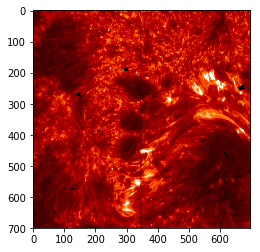

In [22]:
plt.imshow( obs.sji[0][50,:,:].clip(min=0)**0.4, cmap="gist_heat", vmax=15 )

In [23]:
obs.close()

## 2. N-step Raster Observations

IRIS not only has a sit-and-stare (or fixed slit) mode, but also a sweeping raster mode:

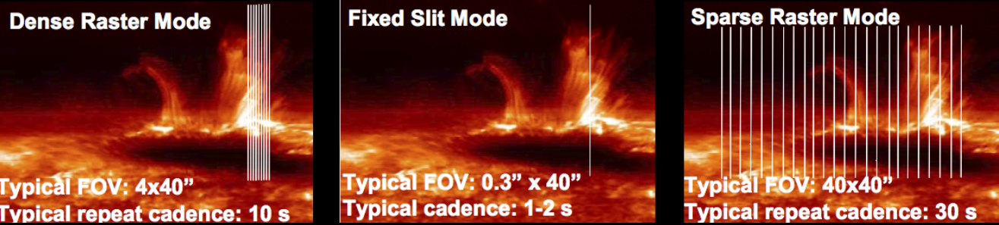

To extract time series of spectra or SJI from an n-step raster, it makes sense to distinguish between the different locations on the sun (=raster positions) and form a spatio-temporal data cube for each position. IRISreader makes this easy by offering the methods `get_raster_pos_data( raster_pos )` (return data cube for given raster position), `get_raster_pos_headers( raster_pos )` (return headers for given raster position) and `get_raster_pos_steps( raster_pos )` (return number of recorded steps for given raster position). The total number of raster position can be found in the variable `n_raster_pos`. In addition, the `get_image_step()` and `get_interpolated_image_step()` methods also offer a `raster_pos` argument.

Let us first load an example observation that was taken in raster mode:

In [24]:
# set your path accordingly
obs = observation("/home/chuwyler/Desktop/FITS/20140329_140938_3860258481/", keep_null=True )
obs

Very large coarse 8-step raster 14x175 8s  Si IV   Mg II h/k   Mg II
2014-03-29 14:09:38 - 2014-03-29 17:54:20

SJI lines:
  field  wavelength      description
0  FUV2      1400.0       Si IV 1400
1   NUV      2796.0   Mg II h/k 2796
2   NUV      2832.0  Mg II wing 2832

raster lines:
  field  wavelength   description
0  FUV1      1335.7     C II 1336
1  FUV1      1343.3          1343
2  FUV1      1349.4   Fe XII 1349
3  FUV1      1355.6      O I 1356
4  FUV2      1402.8    Si IV 1403
5   NUV      2832.7          2832
6   NUV      2826.6          2826
7   NUV      2814.4          2814
8   NUV      2796.2  Mg II k 2796

### 1.1 Extracting Spectral Sequences

A data cube with all spectra recorded on a given raster position can be returned for Si IV with

In [25]:
raster = obs.raster("Si IV 1403")
raster.n_raster_pos

8

In [26]:
data = raster.get_raster_pos_data( raster_pos=3 )
data.shape

(180, 1094, 289)

A data cube with 173 time steps, 1094 on the y-axis and 289 pixels on the wavelength axis.

Animation can be done directly with the `animate`-Method:

In [27]:
raster.animate( raster_pos=3 )

Creating animation with 180 frames (this may take while)


Let us check the x-coordinates in the individual raster cube headers to make sure that this is implemented correctly:

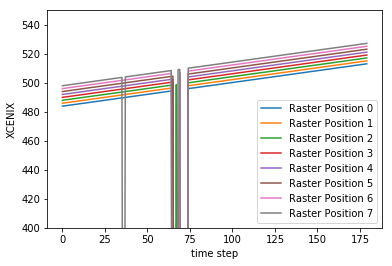

In [28]:
for i in range( raster.n_raster_pos ):
    headers = raster.get_raster_pos_headers( raster_pos=i )
    x = [h['XCENIX'] for h in headers]
    plt.plot( x, label="Raster Position {}".format( i ) )
plt.ylim( [400,550] )
plt.xlabel( "time step" )
plt.ylabel( "XCENIX" )
plt.legend()
plt.show()

Apart from some hickups (7-9 of the exposures contain no data), the x-coordinates of the individually extracted raster series are well separated and follow the same drift in the $x$-direction.

If the spectra need to be interpolated, the `get_interpolated_image_step()` method can be used, similar to the the sit-and-stare case, but this time with the `raster_pos` argument:

In [29]:
raster = obs.raster("Mg II k")
raster.n_raster_pos

8

In [30]:
import numpy as np
from irisreader.data.mg2k_centroids import LAMBDA_MIN, LAMBDA_MAX
from tqdm import tqdm

# can be changed to whatever raster position is required
raster_pos = 2
steps = raster.get_raster_pos_steps( raster_pos )

n_bins = 100
spectral_seq = np.memmap( 
    "spectra_memmap.dat", shape=( steps, raster.shape[1], n_bins ), mode="w+", dtype=np.float16 
)

for i in tqdm( range( steps ) ):
    spectral_seq[i,:,:] = raster.get_interpolated_image_step( 
        i, LAMBDA_MIN, LAMBDA_MAX, n_bins, raster_pos=raster_pos, divide_by_exptime=True 
    )

100%|██████████| 180/180 [00:09<00:00, 19.51it/s]


In [31]:
spectral_seq.shape

(180, 1094, 100)

In [32]:
raster.close() # to save RAM

### 1.2 Extracting Slit-Jaw Image Series

Let us look at the Si IV SJI window:

In [33]:
sji = obs.sji("Si IV")
sji.n_raster_pos

3

The Si IV window has 3 raster positions. Let us extract them all:

In [34]:
sequences = []
for i in range( sji.n_raster_pos ):
    sequences.append( sji.get_raster_pos_data( i ) )

In [35]:
len( sequences )

3

In [36]:
sequences[0].shape

(180, 1094, 1102)

In [37]:
del sequences # to save RAM

This looks good! As before, it's possible to divide by the exposure times with `sji.get_exptimes()`.
Unfortunately, an easy interpolating method for slit-jaw images has not yet been interpolated. If this feature is needed, the `scipy` package offers the required functionality.

Also here, one can just use the `raster_pos` argument in the animation method to plot sequences only from a given raster position:

In [38]:
sji.animate( raster_pos=1, cutoff_percentile=95 )

Creating animation with 180 frames (this may take while)


The flickering is due to missing data because we set `keep_null=True` when opening the observation. Notice that the image does not move horizontally anymore, in contrast to:

In [39]:
sji.animate( cutoff_percentile=95 )

Creating animation with 540 frames (this may take while)


In [40]:
obs.close()